# Description
 This notebooks detects work commuting pattern in a month before covid. We need to understand how to measure frequency, and distance

In [255]:
import os
import tqdm
import warnings
import argparse
import geopandas as gpd
import pandas as pd
from shapely.geometry import Point
import numpy as np
from shapely import wkb
from shapely.geometry import Polygon
import pygeohash
from geofunctions import utils
import seaborn as sn

In [256]:
import importlib

importlib.reload(utils)

<module 'geofunctions.utils' from '/Users/inessat/Documents/phd/empirics/israel/notebooks/phd-remote-work/geofunctions/utils.py'>

In [257]:
MONTH = "202001"

In [258]:
df_filtered_good = pd.read_parquet(
    utils.get_path("raw", "dwells", f"data_filtered_{MONTH}.parquet")
)

In [ ]:
df_filtered_dwells = utils.make_gdf(df_filtered_good, geometry="the_geom")

In [ ]:
path_processed_dir = utils.get_path("processed", "dwells", "home")
homefile = f"home_geohashes_night_shabbat_{MONTH}.csv"
df_homes = pd.read_csv(os.path.join(path_processed_dir, homefile), index_col=0)

In [ ]:
df_homes.head()

,identifier,geohash,night_hours_count,nights_count,rank_night,shabbat_hours_counts,rank_shabbat,weight,rank_weighted,hour_work_home,...,hour_home_all,date_work_home,hour_work_all,date_work_all,share_work_in_home_hours,share_home_work_hours,share_work_in_home_days,share_home_work_days,share_home_hours_home,flag_frequent_user
0,0000be11-1c2a-4833-8f5e-d49f25b5fde9,swny3ss,13.0,6.0,1.0,2.0,1.0,15.0,1.0,4.0,...,31,2.0,9.0,5.0,0.129032,0.444444,0.400000,0.400000,0.483871,True
1,00065be3-e477-417b-b498-51b1e0154e6c,swnvcx9,20.0,9.0,1.0,11.0,1.0,31.0,1.0,10.0,...,56,4.0,17.0,5.0,0.178571,0.588235,0.571429,0.800000,0.553571,True
2,00081fd0-add3-4519-b861-ddfef04fe026,swnvcuz,18.0,11.0,1.0,20.0,1.0,38.0,1.0,2.0,...,60,2.0,11.0,6.0,0.033333,0.181818,0.181818,0.333333,0.633333,True
3,00092423-b349-4e52-bb3b-5a8cf9f35d37,swny1xv,5.0,5.0,1.0,13.0,1.0,18.0,1.0,0.0,...,19,0.0,14.0,5.0,0.000000,0.000000,0.000000,0.000000,0.947368,True
4,00092738-9ce5-45f7-b012-bdc70063e582,swnvcfv,17.0,10.0,1.0,9.0,1.0,26.0,1.0,0.0,...,78,0.0,0.0,0.0,0.000000,NaN,0.000000,NaN,0.333333,False


In [ ]:
df_homes.columns

Index(['identifier', 'geohash', 'night_hours_count', 'nights_count',
       'rank_night', 'shabbat_hours_counts', 'rank_shabbat', 'weight',
       'rank_weighted', 'hour_work_home', 'date_home_all', 'hour_home_all',
       'date_work_home', 'hour_work_all', 'date_work_all',
       'share_work_in_home_hours', 'share_home_work_hours',
       'share_work_in_home_days', 'share_home_work_days',
       'share_home_hours_home', 'flag_frequent_user'],
      dtype='object')

### Keep only dwells of users with clear home location

In [ ]:
df_dwells_users_home = df_homes[
    ["identifier", "geohash", "night_hours_count", "nights_count"]
].merge(df_filtered_dwells, on="identifier", how="inner", suffixes=("_home", ""))

In [ ]:
df_dwells_users_home["date"] = pd.to_datetime(df_dwells_users_home["date"])

In [ ]:
df_dwells_users_home["flag_weekend"] = df_dwells_users_home["date"].dt.weekday.isin(
    [4, 5]
)

In [ ]:
df_dwells_users_home.shape

(2868749, 25)

### Add distance between home and geohash

In [ ]:
df_dwells_users_home["home_geometry"] = df_dwells_users_home["geohash_home"].apply(
    utils.geohash_to_polygon
)
df_dwells_users_home["geometry"] = df_dwells_users_home["geohash"].apply(
    utils.geohash_to_polygon
)

In [ ]:
df_dwells_users_home["distance_home"] = utils.calculate_distance(
    df_dwells_users_home, "home_geometry", "geometry", crs=4326
)

# Identifying work location

In [ ]:
df_dwells_users_home["flag_home_geohash"] = (
    df_dwells_users_home["geohash_home"] == df_dwells_users_home["geohash"]
)

In [ ]:
### explode dwells to hourly signals
df_dwells_users_home["hours_in_interval"] = df_dwells_users_home.apply(
    lambda row: pd.date_range(
        start=row["start_date_time"].floor("h"),
        end=row["end_date_time"].ceil("h") - pd.Timedelta(hours=1),
        freq="h",
    ).tolist(),
    axis=1,
)

# Explode the hours into separate rows
df_hours = df_dwells_users_home.explode("hours_in_interval")
df_hours["hour"] = df_hours["hours_in_interval"].dt.hour

In [ ]:
df_hours["flag_weekend"] = pd.to_datetime(df_hours["date"]).dt.weekday.isin([4, 5])
df_hours["flag_night"] = (df_hours["hour"] <= 8) | (df_hours["hour"] >= 22)
df_hours["flag_home_hour"] = df_hours["flag_night"] | df_hours["flag_weekend"]

### Biggest number of hours/ days after home excluding weekends and night. and at least 1 km away

In [ ]:
users_geohash = (
    df_hours[~df_hours["flag_home_hour"]]
    .groupby(["identifier", "geohash"])
    .size()
    .rename("hours_count")
    .to_frame()
    .join(
        df_hours[~df_hours["flag_home_hour"]]
        .groupby(["identifier", "geohash"])["date"]
        .nunique()
        .rename("days_count")
        .to_frame()
    )
    .reset_index()
)

Minimum 3 hours and 2 days

In [ ]:
users_geohash = users_geohash[
    (users_geohash.hours_count >= 3) & (users_geohash.days_count >= 2)
]

In [ ]:
users_geohas_home = users_geohash.merge(
    df_homes[["identifier", "geohash", "rank_night"]],
    how="left",
    on=["identifier", "geohash"],
)

In [ ]:
users_geohas_home.isnull().mean()

identifier     0.00000
geohash        0.00000
hours_count    0.00000
days_count     0.00000
rank_night     0.81612
dtype: float64

Exclude locations near home

In [ ]:
users_geohas_home = users_geohas_home.merge(
    df_dwells_users_home[["identifier", "geohash", "distance_home"]].drop_duplicates(),
    on=["identifier", "geohash"],
)

In [ ]:
users_geohas_no_home = users_geohas_home[users_geohas_home["distance_home"] > 1000]

Exclude locations with signals at weekend

In [ ]:
no_weekend_signals = df_hours.groupby(["identifier", "geohash"])["flag_weekend"].sum()[
    df_hours.groupby(["identifier", "geohash"])["flag_weekend"].sum() == 0
]

In [ ]:
users_geohas_no_home = users_geohas_no_home.merge(
    no_weekend_signals.reset_index(), on=["identifier", "geohash"], how="inner"
)

### Calculate rank

In [ ]:
users_geohas_no_home["rank_hours_out_home"] = users_geohas_no_home.groupby(
    "identifier"
)["hours_count"].rank(ascending=False, method="first")

In [ ]:
users_geohas_no_home["rank_days_out_home"] = users_geohas_no_home.groupby("identifier")[
    "days_count"
].rank(ascending=False, method="first")

## Choosing to which metric we trust more

In [ ]:
users_geohash_work_v1 = users_geohas_no_home[
    (users_geohas_no_home.rank_hours_out_home < 2)
    | (users_geohas_no_home.rank_days_out_home < 2)
]

In [ ]:
users_geohash_work_v1.shape

(30206, 9)

In [ ]:
users_geohash_work_v1.groupby(
    [
        (users_geohash_work_v1["rank_hours_out_home"] == 1),
        (users_geohash_work_v1["rank_days_out_home"] == 1),
    ]
).size()

rank_hours_out_home  rank_days_out_home
False                True                   3918
True                 False                  3918
                     True                  22370
dtype: int64

In [ ]:
users_geohash_work_v1.groupby(
    (users_geohash_work_v1["rank_hours_out_home"] == 1)
    & (users_geohash_work_v1["rank_days_out_home"] > 1)
)["rank_days_out_home"].mean()

False    1.000000
True     2.447677
Name: rank_days_out_home, dtype: float64

In [ ]:
users_geohash_work_v1.groupby(
    (users_geohash_work_v1["rank_days_out_home"] == 1)
    & (users_geohash_work_v1["rank_hours_out_home"] > 1)
)["rank_hours_out_home"].mean()

False    1.000000
True     2.376212
Name: rank_hours_out_home, dtype: float64

In [ ]:
users_geohash_work_v1.groupby((users_geohash_work_v1["rank_days_out_home"] == 1))[
    "hours_count"
].median()

rank_days_out_home
False    8.0
True     9.0
Name: hours_count, dtype: float64

In [ ]:
users_geohash_work_v1.groupby((users_geohash_work_v1["rank_hours_out_home"] == 1))[
    "hours_count"
].median()

rank_hours_out_home
False     5.0
True     10.0
Name: hours_count, dtype: float64

### Output: we use rank_hours_out_home

In [ ]:
users_geohash_work_v1_final = users_geohash_work_v1[
    users_geohash_work_v1.rank_days_out_home == 1
]

In [ ]:
df_homes_work_v1 = df_homes.merge(
    users_geohash_work_v1_final,
    on="identifier",
    how="left",
    suffixes=("_home", "_work_v1"),
)

In [ ]:
users_geohash_work_v1_final[["identifier", "geohash"]].shape

(26288, 2)

## Add the flag of work location to dwells dataset

In [ ]:
df_dwells_users_home = df_dwells_users_home.drop("geohash_work", axis=1)

In [ ]:
df_dwells_users_home = df_dwells_users_home.merge(
    users_geohash_work_v1_final[["identifier", "geohash"]],
    how="left",
    on=["identifier"],
    suffixes=("", "_work"),
)

In [ ]:
df_dwells_users_home.head()

,identifier,geohash_home,night_hours_count,nights_count,identifier_type,timestamp,local_date_time,province,classification,duration_seconds,...,geohash,date,start_date_time,end_date_time,flag_night,flag_work_hours,home_geometry,flag_work_geohash,flag_weekend,geohash_work
0,0000be11-1c2a-4833-8f5e-d49f25b5fde9,swny3ss,13.0,6.0,IDFA,2020-01-31 10:12:47,2020-01-31 12:12:47,HaMerkaz,AREA_DWELL,802.0,...,swny3ss,2020-01-31,2020-01-31 12:12:47,2020-01-31 12:26:09,False,False,"POLYGON ((34.87335205078125 32.0635986328125, ...",False,True,swny13x
1,0000be11-1c2a-4833-8f5e-d49f25b5fde9,swny3ss,13.0,6.0,IDFA,2020-01-26 09:53:40,2020-01-26 11:53:40,Tel Aviv,AREA_DWELL,2630.0,...,swny32r,2020-01-26,2020-01-26 11:53:40,2020-01-26 12:37:30,False,True,"POLYGON ((34.87335205078125 32.0635986328125, ...",False,False,swny13x
2,0000be11-1c2a-4833-8f5e-d49f25b5fde9,swny3ss,13.0,6.0,IDFA,2020-01-27 09:00:40,2020-01-27 11:00:40,HaMerkaz,AREA_DWELL,2412.0,...,swny3ss,2020-01-27,2020-01-27 11:00:40,2020-01-27 11:40:52,False,True,"POLYGON ((34.87335205078125 32.0635986328125, ...",False,False,swny13x
3,0000be11-1c2a-4833-8f5e-d49f25b5fde9,swny3ss,13.0,6.0,IDFA,2020-01-26 10:49:28,2020-01-26 12:49:28,HaMerkaz,AREA_DWELL,7594.0,...,swny3ss,2020-01-26,2020-01-26 12:49:28,2020-01-26 14:56:02,False,True,"POLYGON ((34.87335205078125 32.0635986328125, ...",False,False,swny13x
4,0000be11-1c2a-4833-8f5e-d49f25b5fde9,swny3ss,13.0,6.0,IDFA,2020-01-27 20:36:11,2020-01-27 22:36:11,HaMerkaz,AREA_DWELL,2901.0,...,swny3ss,2020-01-27,2020-01-27 22:36:11,2020-01-27 23:24:32,True,False,"POLYGON ((34.87335205078125 32.0635986328125, ...",False,False,swny13x


In [ ]:
df_dwells_users_home["flag_work_geohash"] = (
    df_dwells_users_home["geohash"] == df_dwells_users_home["geohash_work"]
)

### Add validation with hours

In [ ]:
df_dwells_users_home.groupby(["flag_work_geohash"])["flag_night"].value_counts(
    normalize=True
)

flag_work_geohash  flag_night
False              False         0.841945
                   True          0.158055
True               False         0.969998
                   True          0.030002
Name: proportion, dtype: float64

### This check triggered to exclude locations with signals in weekends. before it was 10%

In [ ]:
df_dwells_users_home.groupby(["flag_work_geohash"])["flag_weekend"].value_counts(
    normalize=True
)

flag_work_geohash  flag_weekend
False              False           0.724624
                   True            0.275376
True               False           1.000000
Name: proportion, dtype: float64

## Lets visualize a couple of cases

In [ ]:
df_dwells_users_home.columns

Index(['identifier', 'geohash_home', 'night_hours_count', 'nights_count',
       'identifier_type', 'timestamp', 'local_date_time', 'province',
       'classification', 'duration_seconds', 'centroid_latitude',
       'centroid_longitude', 'bump_count', 'potential_start_time',
       'potential_end_time', 'month', 'the_geom', 'frequency',
       'duration_hours', 'geohash', 'date', 'start_date_time', 'end_date_time',
       'flag_night', 'flag_work_hours', 'flag_home_geohash',
       'hours_in_interval', 'home_geometry', 'geometry', 'distance_home',
       'geohash_work', 'flag_work_geohash'],
      dtype='object')

In [ ]:
ident = "0000be11-1c2a-4833-8f5e-d49f25b5fde9"
df_dwells_users_home[df_dwells_users_home.identifier == ident][
    [
        "identifier",
        "geohash",
        "date",
        "start_date_time",
        "end_date_time",
        "distance_home",
        "flag_home_geohash",
        "flag_work_geohash",
    ]
].sort_values("start_date_time")

In [ ]:
one_user_example = utils.make_gdf(
    df_dwells_users_home[df_dwells_users_home.identifier == ident][
        [
            "identifier",
            "geohash",
            "date",
            "start_date_time",
            "end_date_time",
            "distance_home",
            "flag_home_geohash",
            "flag_work_geohash",
            "geometry",
        ]
    ],
    geometry="geometry",
)

In [ ]:
one_user_example.to_file(
    utils.get_path("processed", "dwells", "one_user_signals_example.geojson")
)

### Analyse average commuting frequency

In [302]:
df_days_work_all = (
    df_dwells_users_home.groupby("identifier")["date"]
    .nunique()
    .to_frame()
    .join(
        df_dwells_users_home[df_dwells_users_home["flag_work_geohash"]]
        .groupby("identifier")["date"]
        .nunique()
        .rename("work_date")
        .to_frame(),
        how="inner",
    )
)

In [303]:
df_days_work_all["share_days_work_location"] = (
    df_days_work_all["work_date"] / df_days_work_all["date"]
)

<Axes: >

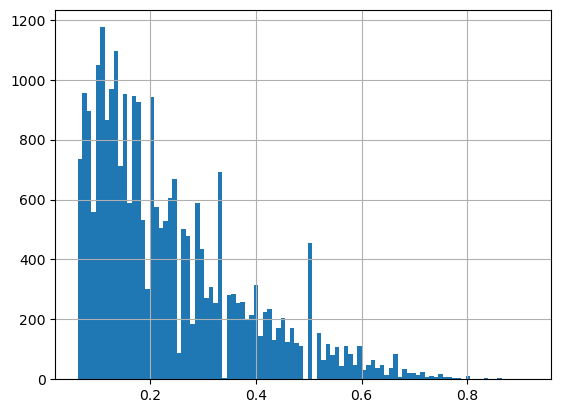

In [ ]:
df_days_work_all["share_days_work_location"].hist(bins=100)

### Add commuting distance to df_days_work_all

In [306]:
df_dwells_users_home.columns

Index(['identifier', 'geohash_home', 'night_hours_count', 'nights_count',
       'identifier_type', 'timestamp', 'local_date_time', 'province',
       'classification', 'duration_seconds', 'centroid_latitude',
       'centroid_longitude', 'bump_count', 'potential_start_time',
       'potential_end_time', 'month', 'the_geom', 'frequency',
       'duration_hours', 'geohash', 'date', 'start_date_time', 'end_date_time',
       'flag_night', 'flag_work_hours', 'home_geometry', 'flag_work_geohash',
       'flag_weekend', 'geohash_work', 'geometry', 'distance_home',
       'flag_home_geohash'],
      dtype='object')

In [311]:
df_days_work_all = df_days_work_all.merge(
    df_dwells_users_home[df_dwells_users_home.flag_work_geohash][
        ["identifier", "distance_home", "home_geometry"]
    ].drop_duplicates(),
    on="identifier",
    how="left",
)

In [314]:
df_user_dashbord = df_days_work_all.merge(df_homes, on="identifier", how="inner")

In [315]:
df_user_dashbord = df_user_dashbord.merge(
    users_geohash_work_v1_final[["identifier", "geohash"]],
    on=["identifier"],
    suffixes=("_home", "_work"),
    how="inner",
)

In [ ]:
df_user_dashbord["weighted_commuting_distance"] = (
    df_user_dashbord["share_days_work_location"] * df_user_dashbord["distance_home"]
)

In [322]:
df_user_dashbord.columns

Index(['identifier', 'date', 'work_date', 'share_days_work_location',
       'distance_home', 'home_geometry', 'geohash_home', 'night_hours_count',
       'nights_count', 'rank_night', 'shabbat_hours_counts', 'rank_shabbat',
       'weight', 'rank_weighted', 'hour_work_home', 'date_home_all',
       'hour_home_all', 'date_work_home', 'hour_work_all', 'date_work_all',
       'share_work_in_home_hours', 'share_home_work_hours',
       'share_work_in_home_days', 'share_home_work_days',
       'share_home_hours_home', 'flag_frequent_user', 'geohash_work',
       'weighted_commuting_distance'],
      dtype='object')

In [ ]:
df_user_dashbord = df_user_dashbord.rename(
    columns={"distance_home": "commuting_distance"}
)

### Aggregate by stat area

In [ ]:
### Add stat area

stat_areas = gpd.read_file(
    utils.get_path("processed", "census", "census_gushdan_main_features.geojson")
)
stat_areas = stat_areas.to_crs(4326)

In [324]:
gdf_user_dashbord = utils.make_gdf(df_user_dashbord, geometry="home_geometry", crs=4326)

In [ ]:
gdf_user_dashbord.shape

(26288, 27)

In [ ]:
# merge
user_dashbord_stat_area = stat_areas[["YISHUV_STAT_2022", "geometry"]].sjoin(
    gdf_user_dashbord, predicate="intersects", how="inner"
)

### For each YISHUV_STAT_2022 we calculate average commuting distance and average work visiting frequency

In [ ]:
stat_area_info = (
    user_dashbord_stat_area.groupby("YISHUV_STAT_2022")[
        ["commuting_distance", "weighted_commuting_distance"]
    ]
    .mean()
    .join(
        user_dashbord_stat_area.groupby("YISHUV_STAT_2022")["identifier"]
        .size()
        .to_frame()
    )
)
stat_areas_commute_data = stat_areas[
    ["YISHUV_STAT_2022", "SHEM_YISHUV_ENG", "pop_approx", "WrkOutLoc_pcnt", "geometry"]
].merge(stat_area_info.reset_index(), on=["YISHUV_STAT_2022"])

In [ ]:
stat_areas_commute_data[stat_areas_commute_data.identifier >= 5].explore(
    column="commuting_distance", scheme="NaturalBreaks"
)